# Calculating Aggregate Raster Statistics from Point Clouds
 Moudry et al. (2023) proposed ten standardized aerial LiDAR-derived vegetation structure variables (e.g., maximum vegetation height, mean vegetation height, canopy cover percentages, and foliage height diversity) that should be made available in common raster formats to assist ecological research. This notebook will calculate each of these  standardized variables from a UAV-LS and C-ALS point cloud at a chosen standard resolution (e.g. 1 meter).  
 

### UAV - LiDAR
Between June and October 2023, UAV LiDAR data was collected using a DJI Matrice 300 drone flying at an altitude of approximately 60 meters, achieving a high point density of around 300 points per square meter. The sites are mostly comprised of oak woodlands and are in the southwest corner of the Sedgwick Reserve and just outside the western edge of the reserve 

![](data/figures/2024-04-30-09-18-08.png)

### Crewed Airborne LiDAR

The Crewed Airborne LiDAR (ALS) data was collected by NCALM on November 4, 2020, with a point density of approximatley 10 points per square meter 

![](data/figures/2024-04-30-09-14-51.png)

In [16]:
import pdal
import json
import laspy
import numpy as np
import rasterio
import earthpy.plot as ep

## Using PDAL to Clip, Classify Ground Points, and Calculate Height Above Ground (HAG)
This code defines a function `process_and_classify_las` that processes and classifies LiDAR data in LAS format. The function takes several parameters including the input and output LAS file paths, an optional crop polygon, minimum and maximum Height Above Ground (HAG) for filtering, and boolean flags for noise filtering and reclassification.

The function constructs a PDAL (Point Data Abstraction Library) pipeline for processing the LAS data. The pipeline includes steps for reading the LAS file, optional cropping, optional noise filtering, ground classification, HAG calculation, and range filtering. The processed LAS data is then written to the output file with all extra dimensions included.

The pipeline is defined as a JSON object, which is then converted to a string and passed to the `pdal.Pipeline` constructor to create the pipeline.

Note: Insert Discussion on struggles getting PDAL python functions working.

Creating a fresh environment with only python-pdal installed finally allowed me to use python functions within pdal.

`mamba create -n pdal_env -c conda-forge python-pdal`

In [17]:
import json
import pdal

def process_and_classify_las(input_las, output_las, crop_polygon=None, min_hag=0, max_hag=25, filter_noise=False):
    """
    Parameters:
    input_las (str): Path to the input LAS file.
    output_las (str): Path to the output las file for the classified las
    resolution (float): The resolution for the output GeoTIFF.
    crop_polygon (str): Optional WKT string defining a polygon to crop the LiDAR data.
    min_hag (float): Minimum Height Above Ground for filtering.
    max_hag (float): Maximum Height Above Ground for filtering.
    filter_noise (bool): If True, filters out noise using PDAL's range filter.

    Returns:
    pdal.Pipeline: Configured PDAL pipeline object for filtered LAS file generation.
    """

    # Define the initial part of the pipeline (reading)
    pipeline_def = [
        {
            "type": "readers.las",
            "filename": input_las
        }
    ]

    # Optionally add cropping
    if crop_polygon:
        pipeline_def.append({
            "type": "filters.crop",
            "polygon": crop_polygon
        })

    # Optionally add noise filtering
    if filter_noise:
        pipeline_def.append({
            "type": "filters.range",
            "limits": "Classification![7:7], Classification![18:18]"
        })


    # Identify ground points and calculate HAG. Filter by min/max HAG.
    pipeline_def.extend([
        {
            "type": "filters.assign",
            "assignment": "Classification[:]=0"
        },
        {
            "type": "filters.smrf"
        },
        {
            "type": "filters.hag_delaunay"
        },
        {
            "type": "filters.range",
            "limits": f"HeightAboveGround[{min_hag}:{max_hag}]"
        }
    ])

    ## this works, but we won't use it for now.
    # pipeline_def.extend([
    #     {   
    #     "type": "filters.python",
    #     "script": "pdal_functions.py",
    #     "function": "calculate_percentile",
    #     "module": "anything",
    #     "add_dimension": "Percentile90",
    #     "pdalargs": "{\"resolution\":1.0}"
    #     }
    # ])

    pipeline_def.extend([
        {
            "type": "writers.las",
            "filename": output_las,
            "compression": "laszip",
            "extra_dims":"all"            
        }
    ])


    # Create and return the pipeline
    pipeline_json = json.dumps({"pipeline": pipeline_def})
    return pdal.Pipeline(pipeline_json)

als_process_and_classify_las_pipeline = process_and_classify_las(
    'data/NCALM.las',
    'data/ALS_w_HAG.las',
    crop_polygon="POLYGON ((769896.35733728 3842418.1328511, 769896.35733728 3842929.1497355, 770189.53426184 3842929.1497355, 770189.53426184 3842418.1328511, 769896.35733728 3842418.1328511))",
    min_hag=0,
    max_hag=25,
    filter_noise=True
)

als_process_and_classify_las_pipeline.execute()
print("als las pipeline executed successfully.")

uls_process_and_classify_las_pipeline = process_and_classify_las(
    'UAV_LiDAR/Sedgwick_LAS.las', #file too big for github
    'data/ULS_w_HAG.las',
    crop_polygon="POLYGON ((769896.35733728 3842418.1328511, 769896.35733728 3842929.1497355, 770189.53426184 3842929.1497355, 770189.53426184 3842418.1328511, 769896.35733728 3842418.1328511))",
    min_hag=0,
    max_hag=25,
    filter_noise=True
)

## this works but the source LAS file is too big for github
# uls_process_and_classify_las_pipeline.execute()
# print("uls las pipeline executed successfully.")

als las pipeline executed successfully.


## PDAL Pipeline to Create Aggregate Raster from LAS file
This produces some canned output of min, max, mean, standard-deviation, IDW, and point count. Despite extensive efforts, I was unable to get additional measures from a pdal pipeline. Therefore, I abandoned this path in favor of doing all the calculations from "scratch" via LASPy. I can still use the PDAL aggregate rasters to validate my results from LASpy. 

(6, 256, 147)


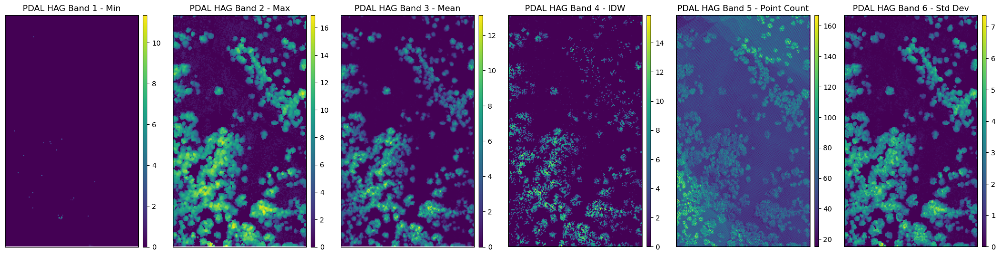

array([<Axes: title={'center': 'PDAL HAG Band 1 - Min'}>,
       <Axes: title={'center': 'PDAL HAG Band 2 - Max'}>,
       <Axes: title={'center': 'PDAL HAG Band 3 - Mean'}>,
       <Axes: title={'center': 'PDAL HAG Band 4 - IDW'}>,
       <Axes: title={'center': 'PDAL HAG Band 5 - Point Count'}>,
       <Axes: title={'center': 'PDAL HAG Band 6 - Std Dev'}>],
      dtype=object)

In [18]:
def process_and_classify_las_to_tif(input_las, output_tif, crop_polygon=None, min_hag=0, max_hag=25, filter_noise=False):
    """
    Creates a PDAL pipeline for generating standard aggregate raster statistics from LiDAR data with options for cropping, noise filtering, and reclassification.

    Parameters:
    input_las (str): Path to the input LAS file.
    output_tif (str): Path to the output las file for the classified tif
    resolution (float): The resolution for the output GeoTIFF.
    crop_polygon (str): Optional WKT string defining a polygon to crop the LiDAR data.
    min_hag (float): Minimum Height Above Ground for filtering.
    max_hag (float): Maximum Height Above Ground for filtering.
    filter_noise (bool): If True, filters out noise using PDAL's range filter.

    Returns:
    pdal.Pipeline: Configured PDAL pipeline object for tif generation.
    """

    # Define the initial part of the pipeline (reading)
    pipeline_def = [
        {
            "type": "readers.las",
            "filename": input_las
        }
    ]

    # Optionally add cropping
    if crop_polygon:
        pipeline_def.append({
            "type": "filters.crop",
            "polygon": crop_polygon
        })

    # Optionally add noise filtering
    if filter_noise:
        pipeline_def.append({
            "type": "filters.range",
            "limits": "Classification![7:7], Classification![18:18]"
        })


    # Identify ground points and calculate HAG. Filter by min/max HAG.
    pipeline_def.extend([
        {
            "type": "filters.assign",
            "assignment": "Classification[:]=0"
        },
        {
            "type": "filters.smrf"
        },
        {
            "type": "filters.hag_delaunay"
        },
        {
            "type": "filters.range",
            "limits": f"HeightAboveGround[{min_hag}:{max_hag}]"
        }
    ])

    # this works, but we won't use it for now.
    # pipeline_def.extend([
    #     {   
    #     "type": "filters.python",
    #     "script": "pdal_functions.py",
    #     "function": "calculate_percentile",
    #     "module": "anything",
    #     "add_dimension": "Percentile90",
    #     "pdalargs": "{\"resolution\":1.0}"
    #     }
    # ])
    
    
    pipeline_def.extend([
        {
        "type": "writers.gdal",
        "filename": output_tif,
        "gdaldriver": "GTiff",
        "dimension": "HeightAboveGround",
        "output_type": "all",
        "binmode": True,
        "resolution": 2,
        # "window_size":3,
        "gdalopts": "COMPRESS=LZW,TILED=YES,blockxsize=256,blockysize=256,COPY_SRC_OVERVIEWS=YES"
        }
    ])    

    

    # Create and return the pipeline
    pipeline_json = json.dumps({"pipeline": pipeline_def})
    return pdal.Pipeline(pipeline_json)

pdal_rasterize_pipeline = process_and_classify_las_to_tif("data/ALS_w_HAG.las", 'data/ALS_w_HAG_pdal_raster_2m.tif')
pdal_rasterize_pipeline.execute()


# Open the  HAG raster using rasterio
with rasterio.open("data/ALS_w_HAG_pdal_raster_2m.tif") as src:
    # Read the raw data 
    pdal_als_2m_raster = src.read()

    # Get the NA value of the raster
    pdal_raster_na_value = src.nodata

    # Get the metadata of the raster
    pdal_raster_metadata = src.meta

print(pdal_als_2m_raster.shape)

ep.plot_bands(
    pdal_als_2m_raster,
    figsize=(20, 10),
    cols=6,
    cmap = "viridis",
    title=["PDAL HAG Band 1 - Min", "PDAL HAG Band 2 - Max", "PDAL HAG Band 3 - Mean", "PDAL HAG Band 4 - IDW", "PDAL HAG Band 5 - Point Count", "PDAL HAG Band 6 - Std Dev"]
)

# The Main Function - agg_las_to_array()
This function will take a LAS file and aggregate it to a n-dimensional array based on the provided resolution and aggregate function. It allows the user to pass any custom aggregate function that takes a 1-D numpy array of points and returns one or more aggregate values as a 1-D numpy array. 

In [19]:
import pandas as pd
import os
import time


def agg_las_to_array(las_file_path, resolution, dimension="HeightAboveGround", aggregate_func=np.mean, *args, **kwargs):
    """
    Convert a LAS file to a 2D numpy array representing an aggregated raster.

    Parameters:
        las_file_path (str): Path to the LAS file.
        resolution (float): Spatial resolution of each cell in X and Y direction. In units of the LAS file.
        dimension (str): LAS point dimension to aggregate across X and Y.
        aggregate_func (function): Aggregate function to apply to the dimension values.
        *args: Additional positional arguments to be passed to the aggregate_func.
        **kwargs: Additional keyword arguments to be passed to the aggregate_func.

    Returns:
        numpy.ndarray: If aggregate_func() returns a single value, a 2D array representing the aggregated raster. If aggregate_func() returns multiple values, a 3D array representing the aggregated raster.
    """
    start_time = time.time()

    # Load the LAS file
    las = laspy.read(las_file_path)

    # Extract coordinates and dimension values
    x_points = las.x
    y_points = las.y
    dimension_values = getattr(las, dimension)

    # Define the bounds and extents of the grid
    min_x, max_x = np.min(x_points), np.max(x_points)
    min_y, max_y = np.min(y_points), np.max(y_points)

    # Determine the size of the raster
    width = int(np.round((max_x - min_x) / resolution))
    height = int(np.round((max_y - min_y) / resolution))

    # Calculate the indices of the points in the grid
    x_indices = ((x_points - min_x) / resolution).astype(int)
    y_indices = (height - (y_points - min_y) / resolution).astype(int)

    # Create a DataFrame to store the indices and dimension values
    df = pd.DataFrame({'x_indices': x_indices, 'y_indices': y_indices, 'dimension_values': dimension_values})

    #
    try:
        # Group by x_indices and y_indices and aggregate dimension_values using the provided function
        grouped_df = df.groupby(['x_indices', 'y_indices'])['dimension_values'].agg(lambda x: aggregate_func(x.to_numpy(), *args, **kwargs)).reset_index()
        
        #create an empty 2D raster 
        raster = np.zeros((height, width))

        # Filter rows where x_indices and y_indices are within the grid
        grouped_df = grouped_df[(grouped_df['x_indices'].between(0, width-1)) & (grouped_df['y_indices'].between(0, height-1))]
        
        # Use numpy indexing to assign values to raster
        raster[grouped_df['y_indices'].values, grouped_df['x_indices'].values] = grouped_df['dimension_values'].values

    #if the aggregate function returns more than one value, then we will use the following code to create a 3D raster
    except ValueError as e:
        if str(e) == 'Must produce aggregated value':
            
            # Group by x_indices and y_indices and aggregate dimension_values using the provided function. The result is a list of aggregated values.
            grouped_df = df.groupby(['x_indices', 'y_indices'])['dimension_values'].agg(lambda x: aggregate_func(x.to_numpy(), *args, **kwargs).tolist()).reset_index()
            
            # Get the number of aggregated values returned from aggregate_func() 
            n_agg_values = len(grouped_df['dimension_values'][0])
            
            #create an empty 3D raster 
            raster = np.zeros((height, width,n_agg_values))

            # Filter rows where x_indices and y_indices are within the grid
            grouped_df = grouped_df[(grouped_df['x_indices'].between(0, width-1)) & (grouped_df['y_indices'].between(0, height-1))]
                        
            for i, row in grouped_df.iterrows():
                if len(row['dimension_values']) > n_agg_values:
                    print(f"Warning: More than {n_agg_values} aggregated values returned. Using the first {n_agg_values} values. Values returned {row['dimension_values']}")
                raster[row['y_indices'], row['x_indices']] = row['dimension_values'][0:n_agg_values]
                
        else:
            raise
    
    #compose and print completion message
    end_time = time.time()
    execution_time = np.round(end_time - start_time,1) 
    n_points = "{:,}".format(np.size(x_points))
    filename = os.path.basename(las_file_path)
    agg_func_name = aggregate_func.__name__
    shape_str = "x".join(map(str, raster.shape))
    print(f"{filename} ({n_points} pts) aggregated via {agg_func_name}() to {shape_str} array. [{execution_time} seconds]")            
    
    return raster




## Helper Functions to Stack and Plot Rasters
The following functions will allow us to quickly compare multiple rasters by stacking and plotting them side by side via `earthpy.plot`

In [20]:
import numpy as np

def stack_rasters(*rasters):
    stacked_image = np.stack(rasters, axis=2)
    return np.transpose(stacked_image, (2, 0, 1))


def plot_rasters(rasters, figsize = (12, 12),titles = None):
    ncols = rasters.shape[0]
    ep.plot_bands(
            rasters,
            cols=ncols,
            figsize=figsize,
            cmap = "viridis",
            title=titles
        )
    
def stack_and_plot_rasters(*rasters, titles = None, figsize = (12, 12)):
    stacked_rasters = stack_rasters(*rasters)
    plot_rasters(stacked_rasters, titles=titles, figsize=figsize)

def compare_two_rasters(rstr1, rstr2, rstr1_name, rstr2_name, metric_str, remove_outliers = True, figsize = (12, 12)):
    title1 = f"{rstr1_name} {metric_str}"
    title2 = f"{rstr2_name} {metric_str}"
    title3 = f"{rstr1_name}-{rstr2_name} {metric_str}"

    error_rstr = (rstr1 - rstr2) #/ rstr1
    if remove_outliers:
        # set outliers to the 95th percentile. This is to make the plots more readable.
        threshold = np.percentile(np.abs(error_rstr), 95)  
        error_rstr[(error_rstr < -threshold)] = -threshold
        error_rstr[(error_rstr > threshold)] = threshold

    stack_and_plot_rasters(rstr1, rstr2, error_rstr
                       , titles=[title1, title2, title3],figsize=figsize) 

def create_pctile_plot_titles(percentile): 
    return [f"{x:.0f}%"  for x in percentile]


def create_density_plot_titles(density_lvl_minmax_hag, density_layers): 
    plot_titles = [] 
    for i in range(density_layers): 
        min_val = density_lvl_minmax_hag[0] + (i * (density_lvl_minmax_hag[1] - density_lvl_minmax_hag[0]) / density_layers) 
        max_val = density_lvl_minmax_hag[0] + ((i+1) * (density_lvl_minmax_hag[1] - density_lvl_minmax_hag[0]) / density_layers) 
        title = f" {min_val:.0f}-{max_val:.0f}m" 
        plot_titles.append(title) 

    return plot_titles


def compare_two_n_dim_rasters(rstr1, rstr2, rstr1_name, rstr2_name, plot_title_function, *args, **kwargs):
    t_rstr1 = np.transpose(rstr1, (2, 0, 1))
    t_rstr2 = np.transpose(rstr2, (2, 0, 1))
    error_rstr = (t_rstr1 - t_rstr2) #/ t_rstr1

    # set outliers to the 95th percentile. This is to make the plots more readable.
    threshold = np.percentile(np.abs(error_rstr), 95)  
    error_rstr[(error_rstr < -threshold)] = -threshold
    error_rstr[(error_rstr > threshold)] = threshold

    ncols = t_rstr1.shape[0]
    titles1 = [rstr1_name + title for title in plot_title_function(*args, **kwargs)]
    titles2 = [rstr2_name + title for title in plot_title_function(*args, **kwargs)]
    titles3 = [f"{rstr1_name}-{rstr2_name}" + title for title in plot_title_function(*args, **kwargs)]
    figsize = (20, 10)
    
    ep.plot_bands(t_rstr1, figsize=figsize, cols=ncols, cmap = "viridis", title=titles1)
    ep.plot_bands(t_rstr2, figsize=figsize, cols=ncols, cmap = "viridis", title=titles2)
    ep.plot_bands(error_rstr, figsize=figsize, cols=ncols, cmap = "PiYG", title=titles3)        

## Quality Checks
Compare results from my function and the results from PDAL (Using ALS at 2m resolution).

ALS_w_HAG.las (2,034,331 pts) aggregated via mean() to 256x147 array. [1.3 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via max() to 256x147 array. [1.1 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via point_count() to 256x147 array. [0.9 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via min() to 256x147 array. [1.1 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via std() to 256x147 array. [2.0 seconds]


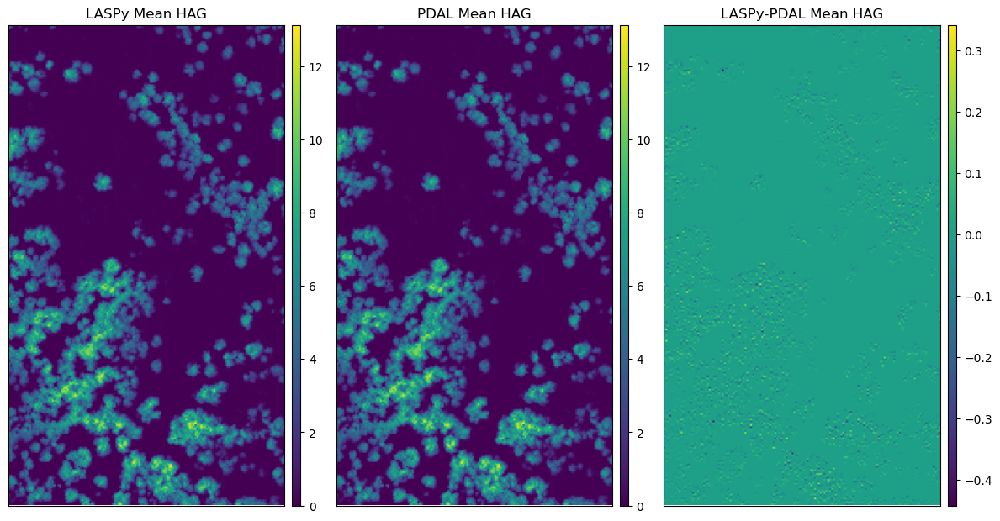

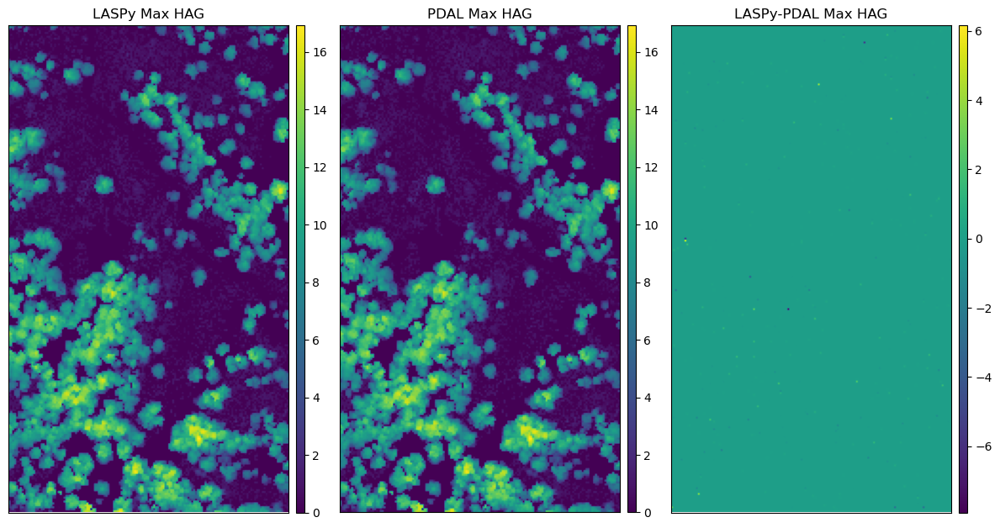

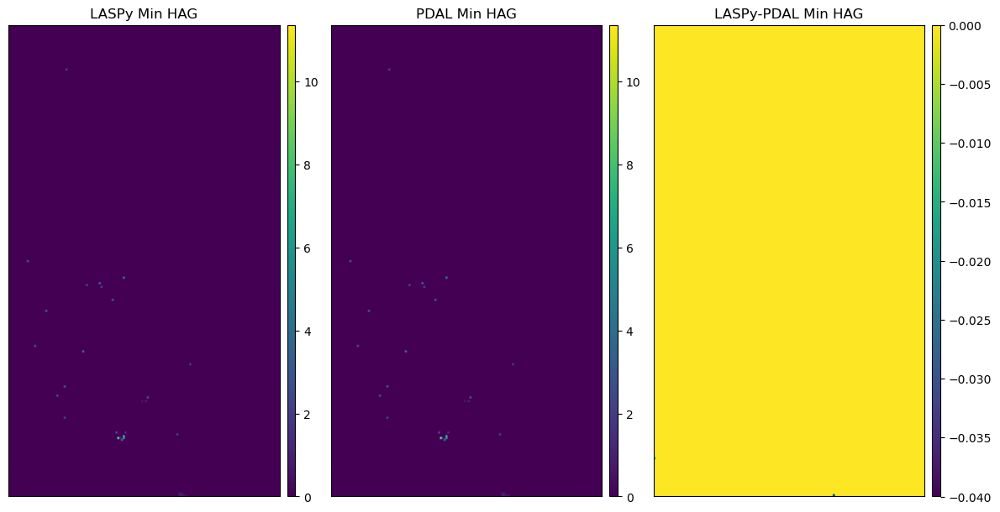

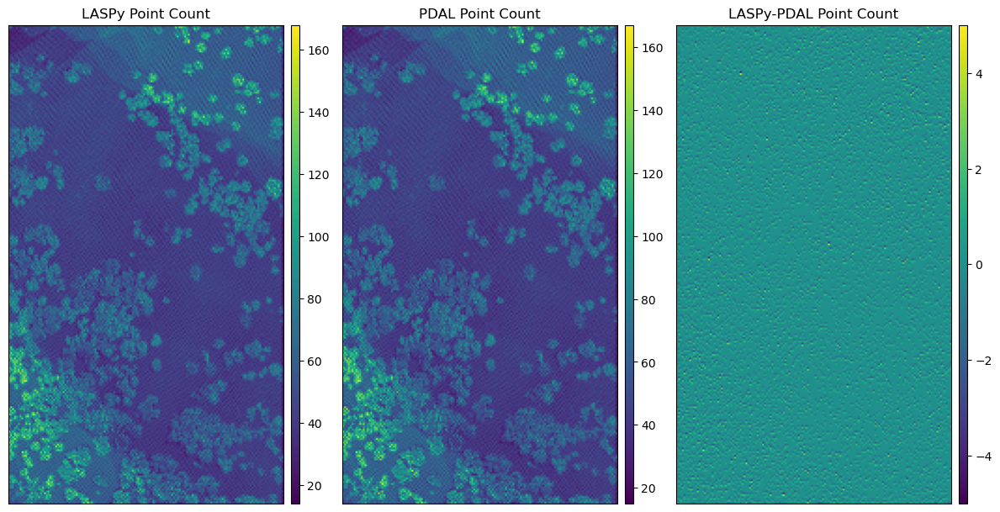

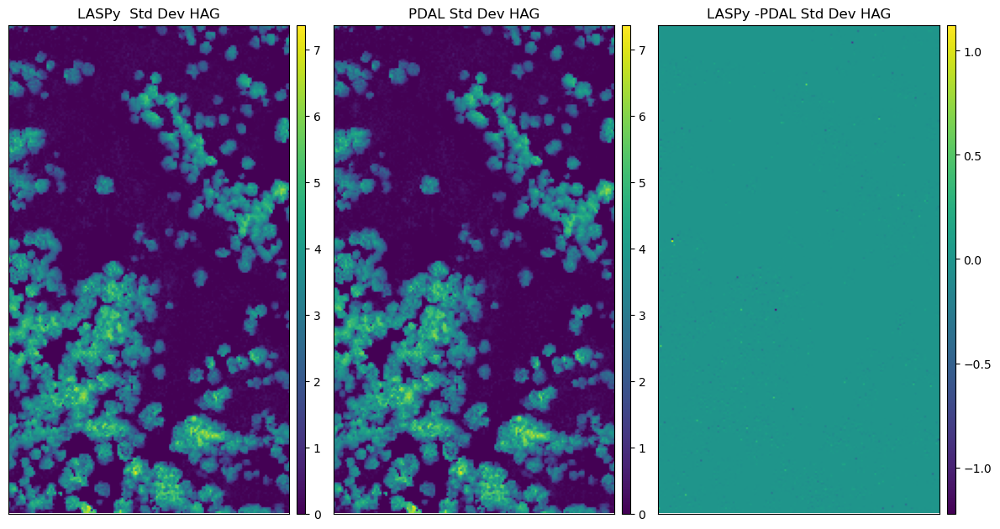

In [21]:
def point_count(point_array):    
    return point_array.size

als_laspy_avg_2m = agg_las_to_array('data/ALS_w_HAG.las', resolution=2, dimension="HeightAboveGround", aggregate_func=np.mean)
als_laspy_max_2m = agg_las_to_array('data/ALS_w_HAG.las', resolution=2, dimension="HeightAboveGround", aggregate_func=np.max)
als_laspy_point_count_2m = agg_las_to_array('data/ALS_w_HAG.las', resolution=2, dimension="HeightAboveGround", aggregate_func=point_count)
als_laspy_min_2m = agg_las_to_array('data/ALS_w_HAG.las', resolution=2, dimension="HeightAboveGround", aggregate_func=np.min)
als_laspy_std_2m = agg_las_to_array('data/ALS_w_HAG.las', resolution=2, dimension="HeightAboveGround", aggregate_func=np.std)


#plot comparisons between ALS 2m rasters calculated via PDAL and agg_las_to_array()
compare_two_rasters(als_laspy_avg_2m, pdal_als_2m_raster[2,:,:], 'LASPy', 'PDAL', 'Mean HAG', remove_outliers=False)
compare_two_rasters(als_laspy_max_2m, pdal_als_2m_raster[1,:,:], 'LASPy', 'PDAL', 'Max HAG', remove_outliers=False)
compare_two_rasters(als_laspy_min_2m, pdal_als_2m_raster[0,:,:], 'LASPy', 'PDAL', 'Min HAG', remove_outliers=False)
compare_two_rasters(als_laspy_point_count_2m, pdal_als_2m_raster[4,:,:], 'LASPy', 'PDAL', 'Point Count', remove_outliers=False)
compare_two_rasters(als_laspy_std_2m, pdal_als_2m_raster[5,:,:], 'LASPy ', 'PDAL', 'Std Dev HAG', remove_outliers=False)

There are small but noticable differences between my LASPy aggregate function results and what PDAL produces. These will need to be investigated before publishing anything with my aggregate function. However, I think the results are good enough to move forward for now. A few notes and open questions:
- PDAL by default will aggregate the points within a given radius from the centroid of each pixel. According to the documentation, setting `binmode=True` will just aggregate within the pixels themselves. This is what I am doing with LASPy so I set `binmode=True` for the comparison. 
- There are clearly different points assigned to each pixel when comparing the two methods. Why might this be happening?
- Is it possible for a point to lie *on* the boundary of a pixel? How does each method deal with this?
- Are there NA values that are being addressed differently in each method?
- Are there additional things that PDAL is doing behind the scenes?


# Vegetation Structure Metrics
We are now ready to create functions to calculate each of the individual vegetation structure measures. The following sections will:
1) Define each measure
2) Create a custom python function to calculate the emasure
3) Pass the custom function to `agg_las_to_array()` to calculate that measure for the UAV LiDAR point cloud and the Crewed Aerial LiDAR (NCALM) point clouds. 
4) Plot each resulting raster and the differences between them. 

## Cover & Density Metrics

### Cover of the tree layer (Canopy density) (%)
- The amount of vegetation in the tree/canopy layer. A cover value of 65 means that of all vegetation returns, 65% came from trees
- The number of returns at the top vegetation layer ($N_C$) divided by the total number of vegetation returns ($N_{TV}$).


### Cover of the shrub layer (Mid-story density) (%)
- The amount of vegetation in the shrub/mid-story layer. A cover value of 25 means that of all vegetation returns, 25% came from shrub vegetation 
- The number of returns at the middle vegetation layer ($N_M$) divided by the total number of vegetation returns ($N_{TV}$)


### Cover of the herbaceous layer (Understory density) (%)
- The amount of vegetation in the herbaceous/understory layer. A cover value of 10 means that of all vegetation returns, 10% came from herbaceous vegetation
-  The number of returns at the lowest vegetation layer ($N_U$) divided by the total number of vegetation returns ($N_{TV}$).

![](data/figures/2024-04-30-11-18-32.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via under_story_density() to 511x293 array. [4.1 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via mid_story_density() to 511x293 array. [4.2 seconds]
ALS_w_HAG.las (2,034,331 pts) aggregated via canopy_density() to 511x293 array. [3.7 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via under_story_density() to 511x293 array. [17.9 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via mid_story_density() to 511x293 array. [17.9 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via canopy_density() to 511x293 array. [17.3 seconds]


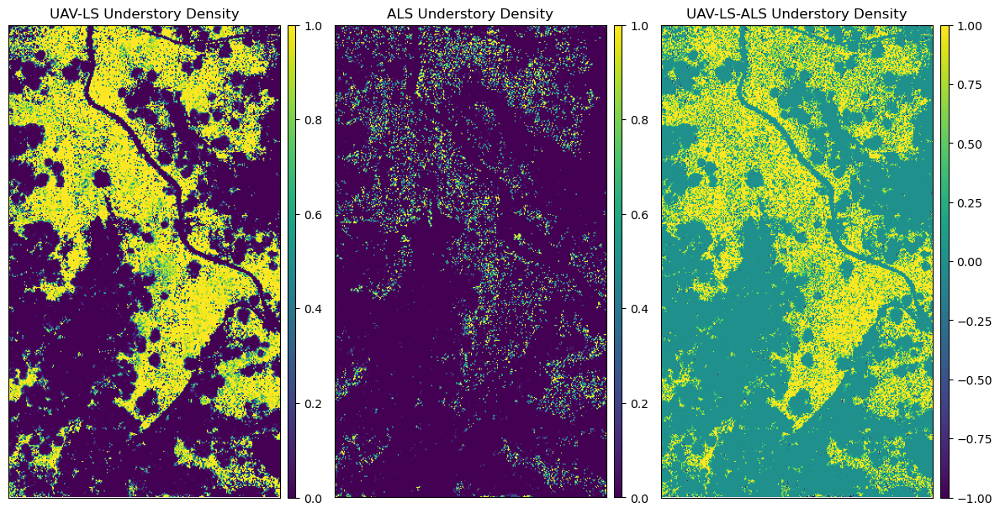

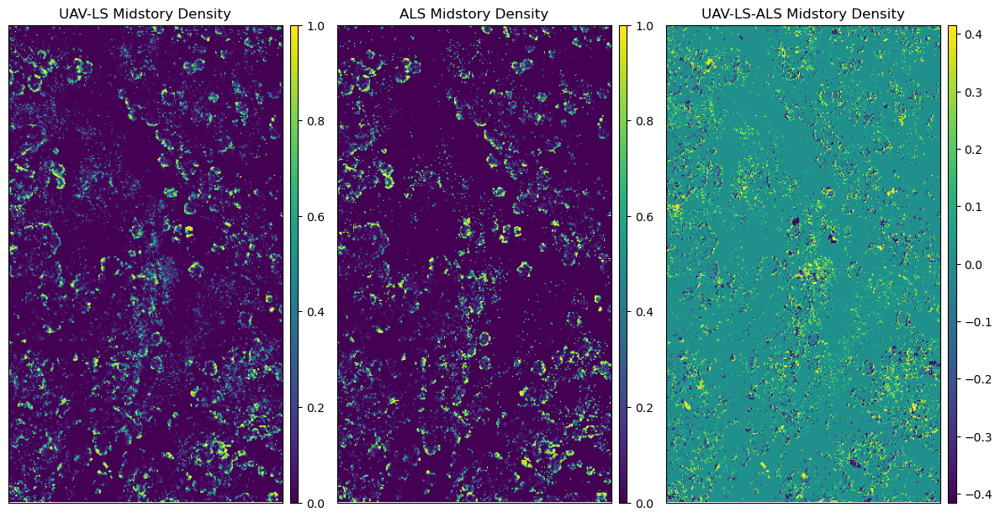

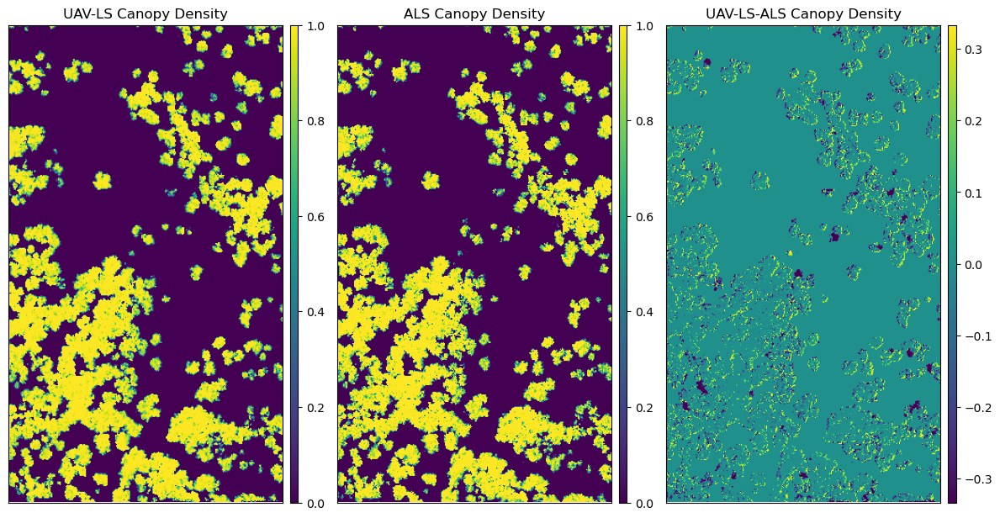

In [22]:
def canopy_density(hag_array, canopy_min_hag):    
    n_canopy_points = hag_array[(hag_array > canopy_min_hag)].size
    n_veg_points = hag_array[(hag_array > 0.1)].size
    if n_veg_points == 0:
        return 0
    else:
        return n_canopy_points / n_veg_points    

def mid_story_density(hag_array, understory_max_hag, canopy_min_hag):
    n_mid_story_points = hag_array[(hag_array >= understory_max_hag) & (hag_array < canopy_min_hag)].size
    n_veg_points = hag_array[(hag_array > 0.1)].size
    if n_veg_points == 0:
        return 0
    else:
        return n_mid_story_points / n_veg_points  

def under_story_density(hag_array, understory_max_hag):
    n_under_story_points = hag_array[(hag_array <= understory_max_hag)& (hag_array > 0.1)].size
    n_veg_points = hag_array[(hag_array > 0.1)].size
    if n_veg_points == 0:
        return 0
    else:
        return n_under_story_points / n_veg_points  

resolution_m = 1
canopy_min_hag = 3
understory_max_hag = 1

#Calculate for ALS 
als_raster_under_story_density = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=under_story_density, understory_max_hag= understory_max_hag)

als_raster_mid_story_density = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=mid_story_density, understory_max_hag= understory_max_hag, canopy_min_hag= canopy_min_hag)

als_raster_canopy_density = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=canopy_density, canopy_min_hag= canopy_min_hag)


#Calculate for ULS
uls_raster_under_story_density = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=under_story_density, understory_max_hag= understory_max_hag)

uls_raster_mid_story_density = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=mid_story_density, understory_max_hag= understory_max_hag, canopy_min_hag= canopy_min_hag)

uls_raster_canopy_density = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=canopy_density, canopy_min_hag= canopy_min_hag)

#plot comparisons between UAV-LS and ALS rasters we just created
compare_two_rasters(uls_raster_under_story_density, als_raster_under_story_density, 'UAV-LS', 'ALS', 'Understory Density')
compare_two_rasters(uls_raster_mid_story_density, als_raster_mid_story_density, 'UAV-LS', 'ALS', 'Midstory Density')
compare_two_rasters(uls_raster_canopy_density, als_raster_canopy_density, 'UAV-LS', 'ALS', 'Canopy Density')

- UAV-LS has much higher herbacous density, could this be due to the time of year?
- UAV-LS has a higher canopy density around the outside of the canopies, could this be because the trees have grown? Could it be a co-registration issue?



### Canopy Cover (%)
- The extent/percentage of the ground covered by vegetation. A Canopy cover value of 85 means that 85% of returns were reflected above x meters. The higher the value, the denser the canopy (closed stands). Low values reflect open or scattered stands (Singh et al., 2017; Tweedy et al., 2019)	
- The number of returns above a given height cutoff ($N_{P}$) divided by the total number of returns ($N_{TF}$).

![](data/figures/2024-04-30-11-13-41.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via canopy_cover() to 511x293 array. [3.3 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via canopy_cover() to 511x293 array. [16.9 seconds]


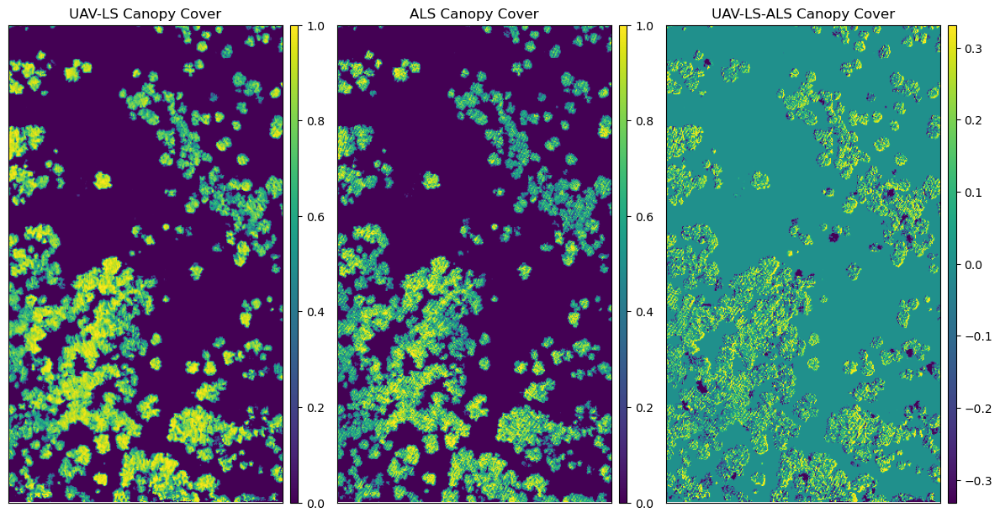

In [23]:
def canopy_cover(hag_array, canopy_min_hag):    
    n_canopy_points = hag_array[(hag_array > canopy_min_hag)].size
    n_points = hag_array.size
    if n_points == 0:
        return 0
    else:
        return n_canopy_points / n_points 


canopy_min_hag = 2


#Calculate for ALS 
als_raster_canopy_density = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=canopy_cover, canopy_min_hag= canopy_min_hag)


#Calculate for ULS
uls_raster_canopy_density = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=canopy_cover, canopy_min_hag= canopy_min_hag)

#plot comparisons between UAV-LS and ALS rasters we just created
compare_two_rasters(uls_raster_canopy_density, als_raster_canopy_density, 'UAV-LS', 'ALS', 'Canopy Cover')

Are there any areas with 100% canopy cover? (i.e. no ground points and only points above 2m)

## Density Proportions (%)
- Vertical distribution of points (vegetation architecture); usually at least ten density bins are calculated
- *Calculation* - Fixed height bins between the minimum and maximum height are used for calculating the proportion of returns in a certain bin to the total number of returns ($N_T$)

![](data/figures/2024-04-30-11-12-49.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via density_proportions() to 511x293x10 array. [15.6 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via density_proportions() to 511x293x10 array. [34.3 seconds]


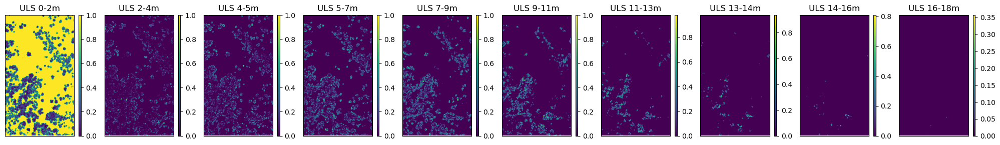

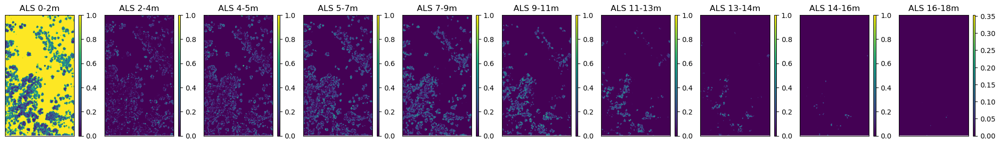

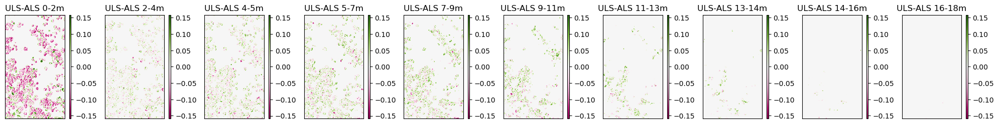

In [24]:

def density_proportions(hag_array, hag_rng, num_layers):
    # Step 1: Bin the point heights into layers based on the specified range
    bins = np.linspace(hag_rng[0], hag_rng[1], num_layers+1)
    layer_indices = np.digitize(hag_array, bins) - 1  # Subtract 1 to start layers at 0

    # Step 2: Count the number of points in each layer
    counts = np.bincount(layer_indices, minlength=num_layers)[0:num_layers]
    
    # Step 3: Calculate the proportion of returns for each layer
    total_counts = np.sum(counts)
    proportions = counts / total_counts

    return proportions

resolution_m = 1
density_layers = 10
density_lvl_minmax_hag = [0, 18]

als_raster_density_proportions = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m,
                                       aggregate_func=density_proportions, hag_rng = density_lvl_minmax_hag, num_layers= density_layers)

uls_raster_density_proportions = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m,
                                       aggregate_func=density_proportions, hag_rng = density_lvl_minmax_hag, num_layers= density_layers)

compare_two_n_dim_rasters(uls_raster_density_proportions,als_raster_density_proportions, 'ULS', 'ALS', create_density_plot_titles, density_lvl_minmax_hag, density_layers) 

## Height Metrics
### Maximum vegetation height (m)	
- The maximum vegetation height provides information about the tallest vegetation, for example a tree or shrub. In the case of trees, height is an indicator of tree diameter and age, which are important factors for species diversity
- *Calculation* - Highest LiDAR vegetation return in a cell ($H_{max}$)

![](data/figures/2024-04-30-10-07-10.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via max() to 511x293 array. [3.3 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via max() to 511x293 array. [16.8 seconds]


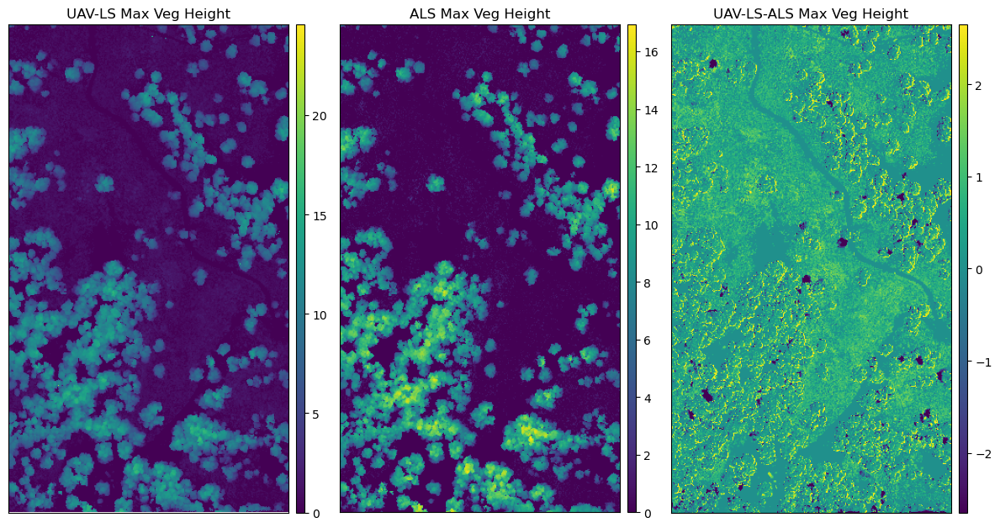

In [25]:
#Calculate for ALS 
als_raster_max_veg_height = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.max)

#Calculate for UAV-LS
uls_raster_max_veg_height = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.max)

compare_two_rasters(uls_raster_max_veg_height,als_raster_max_veg_height,  'UAV-LS', 'ALS', 'Max Veg Height')

### Mean vegetation height (m)	
- Average vegetation height in the cell. For example, well-developed canopies would be expected to have high values of the mean vegetation height, while with the increasing representation of understory and mid-story, the value will decrease
- *Calculation* - The arithmetic mean of the height of all above-ground vegetation returns in a cell ($H_{mean}$)

![](data/figures/2024-04-30-10-08-51.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via mean() to 511x293 array. [4.0 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via mean() to 511x293 array. [17.5 seconds]


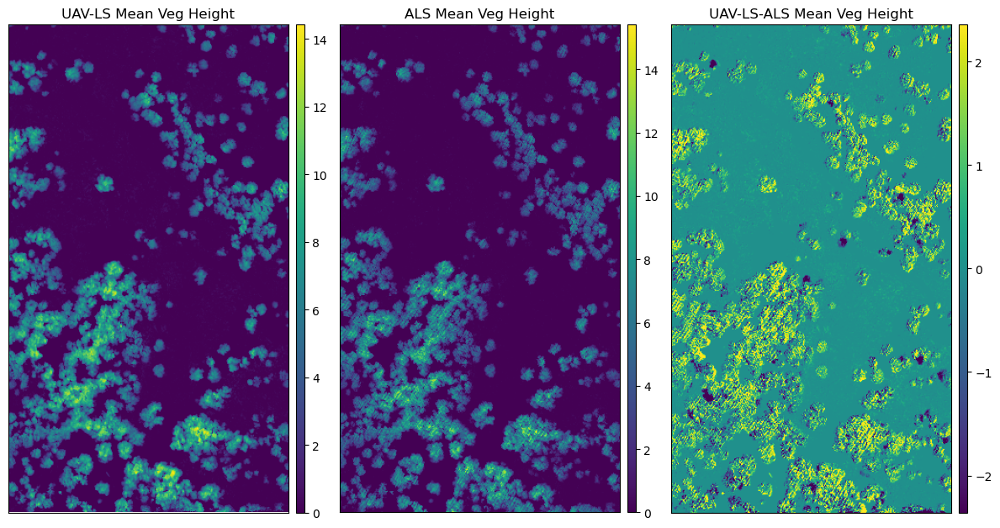

In [26]:
#Calculate for ALS 
als_raster_mean_veg_height = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.mean)

#Calculate for UAV-LS
uls_raster_mean_veg_height = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.mean)

compare_two_rasters(uls_raster_mean_veg_height,als_raster_mean_veg_height,  'UAV-LS', 'ALS', 'Mean Veg Height')

### Height percentiles (m)	
- Heights at which a certain percentage of returns in a cell has been recorded, usually from 5% to 95% in steps of 5%. It shows the vertical distribution of points. 

![](data/figures/2024-04-30-10-11-15.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via percentile() to 511x293x5 array. [21.9 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via percentile() to 511x293x5 array. [41.1 seconds]


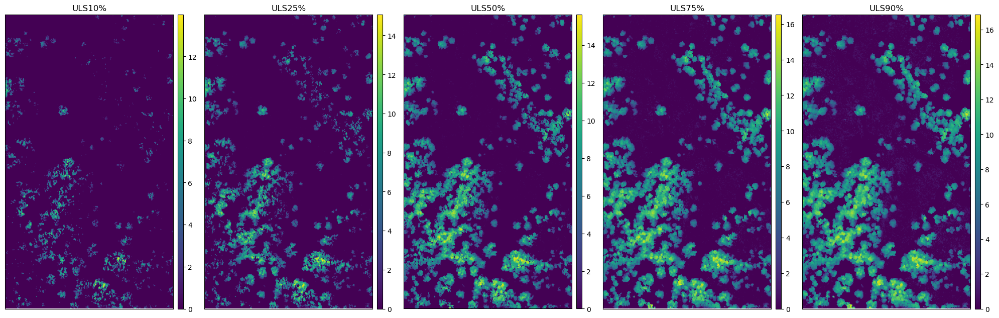

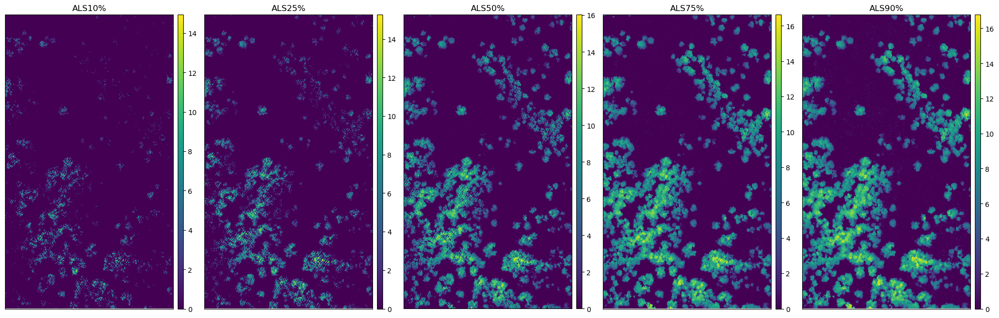

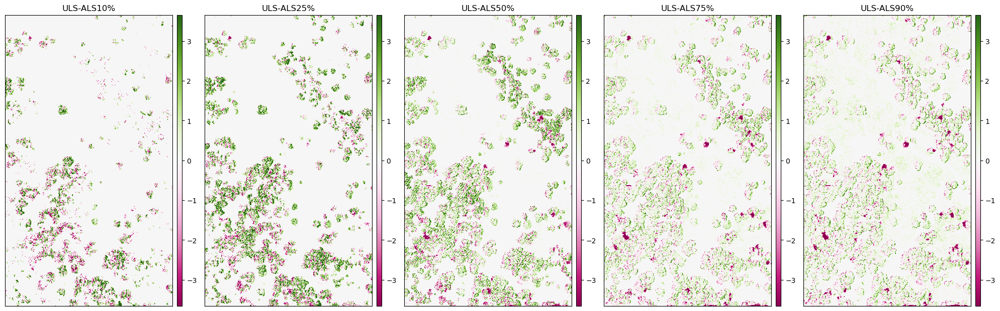

In [27]:
percentile_array = [10,25, 50,75, 90]

#Calculate for ALS 
als_raster_pctile_veg_height = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.percentile, q=percentile_array)

#Calculate for UAV-LS
uls_raster_pctile_veg_height = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.percentile, q=percentile_array)


compare_two_n_dim_rasters(uls_raster_pctile_veg_height,als_raster_pctile_veg_height, 'ULS', 'ALS', create_pctile_plot_titles, percentile_array) 

## Vertical Variability Metrics


### Standard deviation of vegetation height (m)	
- Vertical variability of the vegetation within the cell. Small values arise from areas with homogenous vegetation, while high values reflect vertically heterogeneous vegetation (Melin et al., 2019; Müller & Brandl, 2009; Vogeler et al., 2014)	
-  The standard deviation of vegetation returns heights above ground ($H$) in a cell.

We will use:
https://numpy.org/doc/stable/reference/generated/numpy.std.html

![](data/figures/2024-04-30-10-15-21.png)

ALS_w_HAG.las (2,034,331 pts) aggregated via std() to 511x293 array. [7.3 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via std() to 511x293 array. [20.7 seconds]


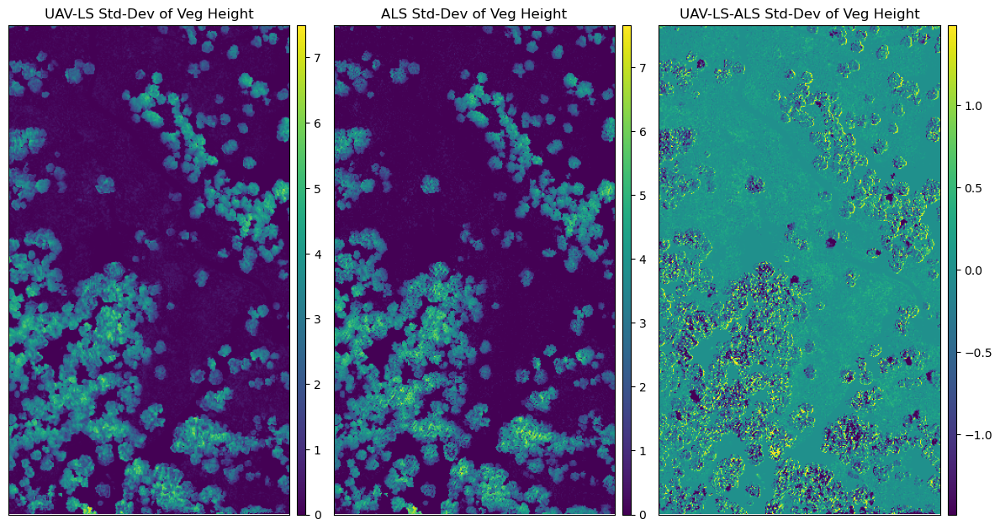

In [28]:
#Calculate for ALS 
als_raster_std_dev_veg_height = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.std)

#Calculate for UAV-LS
uls_raster_std_dev_veg_height = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m, 
                                       aggregate_func=np.std)

compare_two_rasters(uls_raster_std_dev_veg_height,als_raster_std_dev_veg_height,  'UAV-LS', 'ALS', 'Std-Dev of Veg Height')

### Foliage height diversity (FHD) based on Shannon-Wiener index	
A measure of canopy layering (MacArthur & MacArthur, 1961). The maximum possible value increases with the increasing number of layers and the maximum value occurs when all layers have the same number of returns (i.e., the Shannon-Wiener index increases with a more even distribution of points over the layers). The number of used layers varies slightly in existing studies (Bae et al., 2014; Clawges et al., 2008; Weisberg et al., 2014). From the producer's perspective and for maintaining simplicity, it is reasonable to use the same bins as for the Density proportions	

*Calculation* 

FHD = $-\sum_{i=1}^{n} p_i \cdot \ln(p_i)$

where $p_i$ is the proportion of returns in each vertical layer $i$, and $n$ is the total number of layers.

![](data/figures/2024-04-30-10-17-06.png)


ALS_w_HAG.las (2,034,331 pts) aggregated via foliage_height_diversity() to 511x293 array. [10.6 seconds]
ULS_w_HAG.las (89,395,661 pts) aggregated via foliage_height_diversity() to 511x293 array. [25.0 seconds]


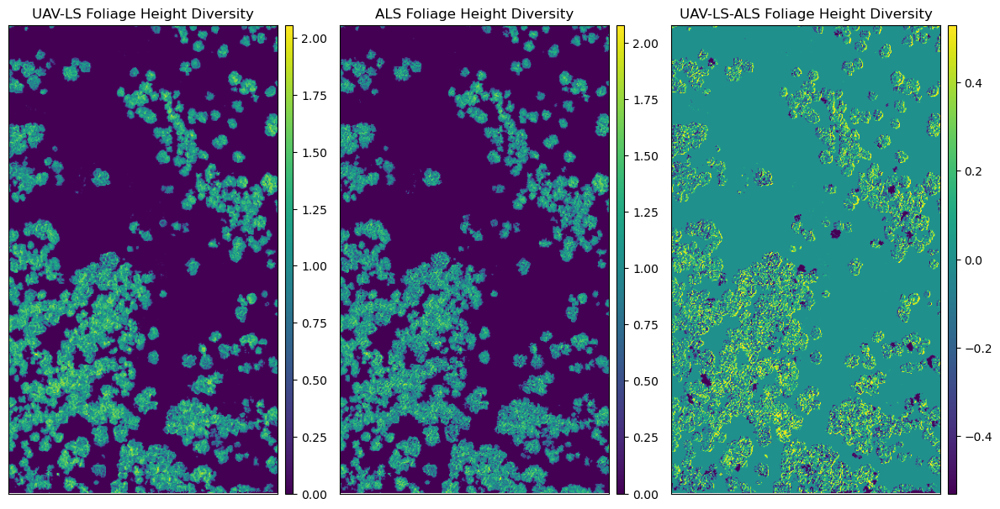

In [29]:
def foliage_height_diversity(hag_array, hag_rng, num_layers):

    # Calculate the density proportions for each layer
    proportions = density_proportions(hag_array,hag_rng, num_layers)
    
    # Calculate the FHD using the Shannon-Wiener index formula
    # We avoid log(0) by masking zero proportions
    mask = proportions > 0
    fhd = -np.sum(proportions[mask] * np.log(proportions[mask]))
    
    return fhd



#Calculate for ALS 
als_raster_fhd = agg_las_to_array('data/ALS_w_HAG.las', resolution=resolution_m,
                                       aggregate_func=foliage_height_diversity, hag_rng = density_lvl_minmax_hag, num_layers= density_layers)

#Calculate for UAV-LS
uls_raster_fhd = agg_las_to_array('data/ULS_w_HAG.las', resolution=resolution_m,
                                       aggregate_func=foliage_height_diversity, hag_rng = density_lvl_minmax_hag, num_layers= density_layers)

compare_two_rasters(uls_raster_fhd,als_raster_fhd,  'UAV-LS', 'ALS', 'Foliage Height Diversity')
